In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('D:\\data_science_repo\\Flipkart_Sentiment_Analysis\\Flipkart.csv')

In [3]:
df.head()

,product_name,product_price,Rate,Review,Summary,Sentiment
0,Candes 12 L Room/Personal Air Cooler??????(Whi...,3999,5,super!,great cooler excellent air flow and for this p...,positive
1,Candes 12 L Room/Personal Air Cooler??????(Whi...,3999,5,awesome,best budget 2 fit cooler nice cooling,positive
2,Candes 12 L Room/Personal Air Cooler??????(Whi...,3999,3,fair,the quality is good but the power of air is de...,positive
3,Candes 12 L Room/Personal Air Cooler??????(Whi...,3999,1,useless product,very bad product its a only a fan,negative
4,Candes 12 L Room/Personal Air Cooler??????(Whi...,3999,3,fair,ok ok product,neutral


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205052 entries, 0 to 205051
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   product_name   205052 non-null  object
 1   product_price  205052 non-null  object
 2   Rate           205052 non-null  object
 3   Review         180388 non-null  object
 4   Summary        205041 non-null  object
 5   Sentiment      205052 non-null  object
dtypes: object(6)
memory usage: 9.4+ MB


In [5]:
df = df[['Summary','Sentiment']]

In [6]:
df.head()

,Summary,Sentiment
0,great cooler excellent air flow and for this p...,positive
1,best budget 2 fit cooler nice cooling,positive
2,the quality is good but the power of air is de...,positive
3,very bad product its a only a fan,negative
4,ok ok product,neutral


In [7]:
for i in df['Summary']:
    print(i)

great cooler excellent air flow and for this price its so amazing and unbelievablejust love it
best budget 2 fit cooler nice cooling
the quality is good but the power of air is decent
very bad product its a only a fan
ok ok product
the cooler is really fantastic and provides good air flow highly recommended
very good product
very nice
very bad cooler
very good
beautiful product good material and perfectly working
awesome
good
wonderful product must buy
nice air cooler smart cool breeze producer
awsm
nice product
great cooler
nice product
good
very nice product
good product
nice product with the reasonable price
i like it
very goodd
good product
good product kawaleti
very good cooler amazing beautiful designs affordable price
using since 3months great experience
very good performance and nice look
product is good having strong thrust of air flow must buy
very good
bad quality
very nice product
very soundless product and low price other company
nice
the best poduct that i bought from fli

In [8]:
import string
punctuation = string.punctuation
from nltk.corpus import stopwords
import nltk

In [9]:
from nltk.stem.porter import PorterStemmer
ps = PorterStemmer()
ps.stem('loving')

'love'

In [10]:
import string
def transform_text(text):
    text = str(text).lower()
    text = nltk.word_tokenize(text)

    y=[]
    for i in text:
        if i.isalnum():
            y.append(i)
    text = y[:]
    y.clear()

    for i in text:
        if i not in stopwords.words('english') and i not in punctuation:
            y.append(i)
    text =y[:]
    y.clear()

    for i in text:
        y.append(ps.stem(i))

    return ' '.join(y)

In [11]:
transform_text("great cooler excellent air flow and for this price its so amazing and unbelievablejust 23 love it")

'great cooler excel air flow price amaz unbelievablejust 23 love'

In [12]:
df['trandformed_summary'] = df['Summary'].apply(transform_text)

In [13]:
df

,Summary,Sentiment,trandformed_summary
0,great cooler excellent air flow and for this p...,positive,great cooler excel air flow price amaz unbelie...
1,best budget 2 fit cooler nice cooling,positive,best budget 2 fit cooler nice cool
2,the quality is good but the power of air is de...,positive,qualiti good power air decent
3,very bad product its a only a fan,negative,bad product fan
4,ok ok product,neutral,ok ok product
...,...,...,...
205047,good product,positive,good product
205048,nice,positive,nice
205049,very nice and fast delivery,positive,nice fast deliveri
205050,awesome product,positive,awesom product


In [14]:
df['trandformed_summary']

0         great cooler excel air flow price amaz unbelie...
1                        best budget 2 fit cooler nice cool
2                             qualiti good power air decent
3                                           bad product fan
4                                             ok ok product
                                ...                        
205047                                         good product
205048                                                 nice
205049                                   nice fast deliveri
205050                                       awesom product
205051    good mix bowl includ one disappointmentand sou...
Name: trandformed_summary, Length: 205052, dtype: object

In [15]:
df['Sentiment'] = df['Sentiment'].replace({'negative':0,'positive':1,'neutral':2})

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_12560\3985059011.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['Sentiment'] = df['Sentiment'].replace({'negative':0,'positive':1,'neutral':2})


In [16]:
from wordcloud import WordCloud
wc = WordCloud(width=500,height=500, min_font_size=10, background_color='white')

In [17]:
new_df = df[df['Summary'] == 0]['trandformed_summary']

In [18]:
Negative_wc = wc.generate(df[df['Sentiment'] == 0]['trandformed_summary'].str.cat(sep = " "))


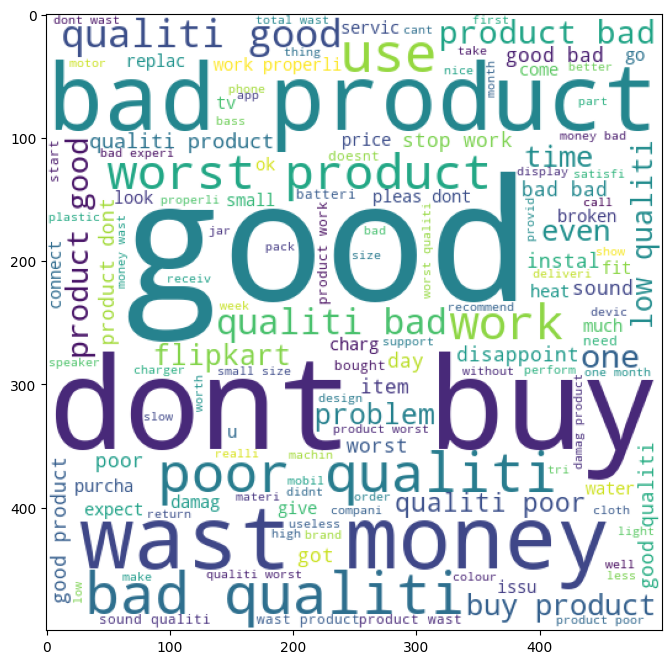

In [19]:
plt.figure(figsize=(12,8))
plt.imshow(Negative_wc)

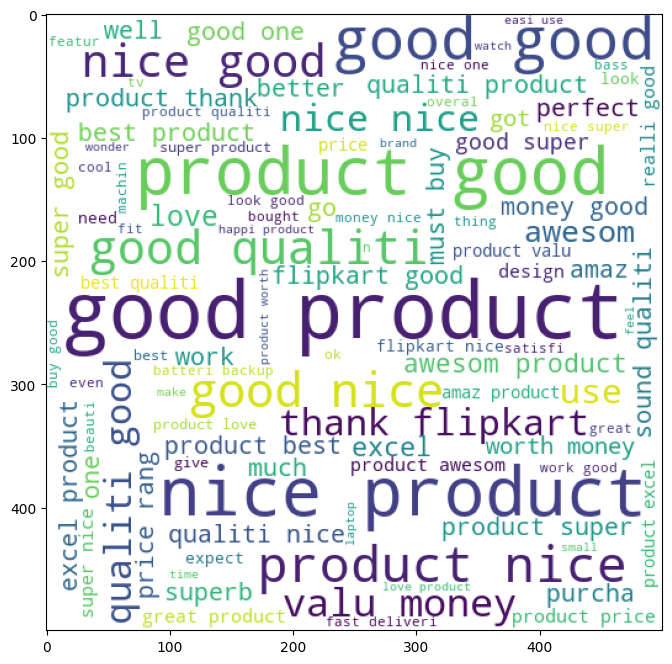

In [20]:
Positive_wc = wc.generate(df[df['Sentiment'] == 1]['trandformed_summary'].str.cat(sep = " "))
plt.figure(figsize=(12,8))
plt.imshow(Positive_wc)

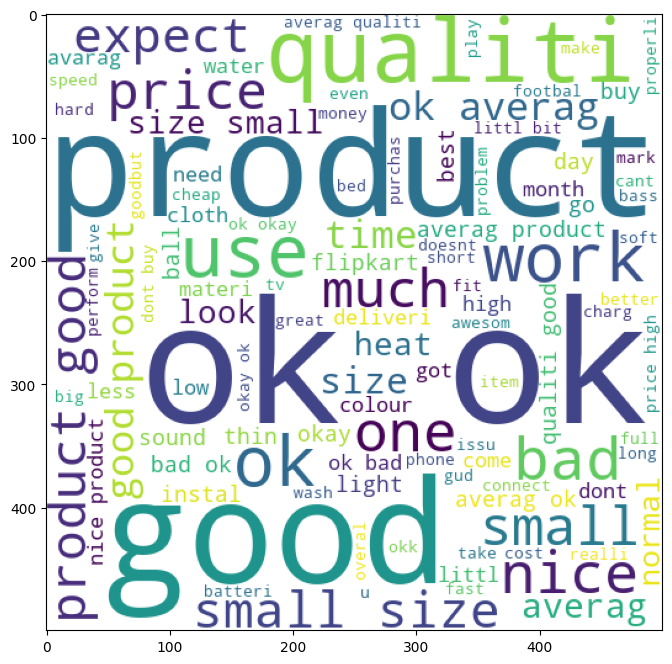

In [21]:
Neutral_wc = wc.generate(df[df['Sentiment'] == 2]['trandformed_summary'].str.cat(sep = " "))
plt.figure(figsize=(12,8))
plt.imshow(Neutral_wc)

In [22]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
cv = CountVectorizer()
tfidf = TfidfVectorizer()

X = tfidf.fit_transform(df['trandformed_summary'])
y=df['Sentiment']

In [23]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
X_train, X_test, y_train,y_test = train_test_split(X,y,test_size=0.2, random_state=2)

In [24]:
from sklearn.naive_bayes import MultinomialNB
mnb = MultinomialNB()
mnb.fit(X_train, y_train)
mnb_pred = mnb.predict(X_test)
accuracy_score(y_test, mnb_pred)

0.8760088756675039

In [25]:
from textblob import TextBlob

user_input = input("Enter a sentence: ")
blob = TextBlob(user_input)

# Polarity ranges from -1 (negative) to 1 (positive)
if blob.sentiment.polarity > 0 and  blob.sentiment.polarity <= 1:
    print("Positive")
elif blob.sentiment.polarity <= 0:
    print("Negative")
elif blob.sentiment.polarity > 1:
    print("Neutral")

Positive


In [28]:
import pickle
pickle.dump(mnb, (open('model.pkl','wb')))